In [1]:
# Análisis Completo del Dataset: Breast Cancer Wisconsin (Diagnostic)
# Proyecto de Clasificación con Múltiples Modelos

# ============================================================================
# PARTE 1: IMPORTACIÓN DE LIBRERÍAS Y CARGA DEL DATASET
# ============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Importar el paquete EDA proporcionado
from PaqEda import analisisEDA

In [3]:
# Librerías para machine learning
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (accuracy_score, precision_score, recall_score, 
                             f1_score, confusion_matrix, classification_report,
                             roc_auc_score, roc_curve)

In [4]:
# Algoritmos de clasificación
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier

print("=" * 80)
print("PROYECTO: ANÁLISIS Y CLASIFICACIÓN DE CÁNCER DE MAMA")
print("Dataset: Breast Cancer Wisconsin (Diagnostic)")
print("=" * 80)


PROYECTO: ANÁLISIS Y CLASIFICACIÓN DE CÁNCER DE MAMA
Dataset: Breast Cancer Wisconsin (Diagnostic)



FASE 1: ANÁLISIS EXPLORATORIO DE DATOS (EDA)

--- INFORMACIÓN GENERAL DEL DATASET ---
Dimensiones: (569, 32)
         diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
id                                                                         
842302           M        17.99         10.38          122.80     1001.0   
842517           M        20.57         17.77          132.90     1326.0   
84300903         M        19.69         21.25          130.00     1203.0   
84348301         M        11.42         20.38           77.58      386.1   
84358402         M        20.29         14.34          135.10     1297.0   

          smoothness_mean  compactness_mean  concavity_mean  \
id                                                            
842302            0.11840           0.27760          0.3001   
842517            0.08474           0.07864          0.0869   
84300903          0.10960           0.15990          0.1974   
84348301          0.14250           0.2839

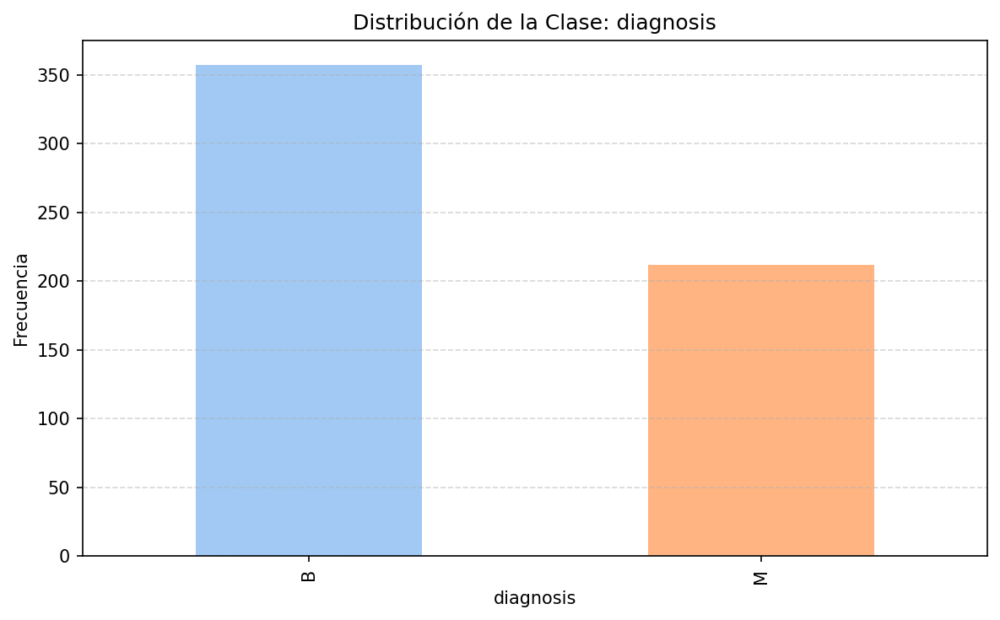

In [5]:
# ============================================================================
# PARTE 2: ANÁLISIS EXPLORATORIO DE DATOS (EDA) COMPLETO
# ============================================================================

print("\n" + "=" * 80)
print("FASE 1: ANÁLISIS EXPLORATORIO DE DATOS (EDA)")
print("=" * 80)

# Cargar el dataset usando el paquete EDA
# Nota: Ajusta el path según donde tengas guardado el archivo
eda = analisisEDA('data.csv', 1)

print("\n--- INFORMACIÓN GENERAL DEL DATASET ---")
eda.analisis()

print("\n--- TIPO DE DATOS ---")
eda.tipoDatos()

print("\n--- VALORES FALTANTES ---")
eda.valores_faltantes()

# Se identifica la columna 'Unnamed: 32' que contiene solo valores nulos.
# Esta columna es un artefacto de la lectura del CSV y no aporta información.
# Se elimina antes de proceder con la eliminación general de valores nulos,
# ya que su presencia vaciaría todo el DataFrame.
if 'Unnamed: 32' in eda.df.columns:
    eda.df = eda.df.drop('Unnamed: 32', axis=1)
    print("\n--- Columna 'Unnamed: 32' eliminada para evitar problemas de Nulos en todo el DF ---")
    # Re-verificar valores faltantes después de eliminar la columna
    print("\n--- VALORES FALTANTES DESPUÉS DE ELIMINAR 'Unnamed: 32' ---")
    eda.valores_faltantes()


print("\n--- ELIMINACIÓN DE DUPLICADOS ---")
eda.eliminarDuplicados()

print("\n--- ELIMINACIÓN DE VALORES NULOS ---")
eda.eliminarNulos()

# Verificar la variable objetivo (diagnosis)
print("\n--- ANÁLISIS DE LA VARIABLE OBJETIVO ---")
if 'diagnosis' in eda.df.columns:
    eda.valores_unicos('diagnosis')
    eda.histogramaClase('diagnosis')


--- GENERANDO VISUALIZACIONES ---
1. Boxplots para detección de outliers...


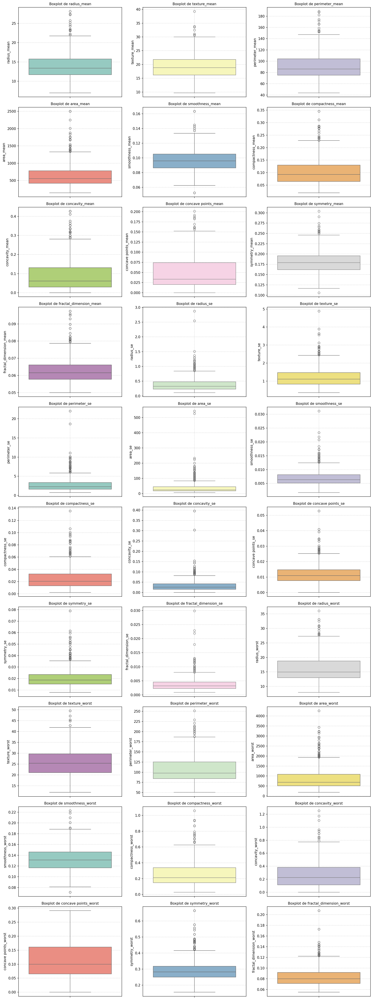

2. Histogramas de distribución...


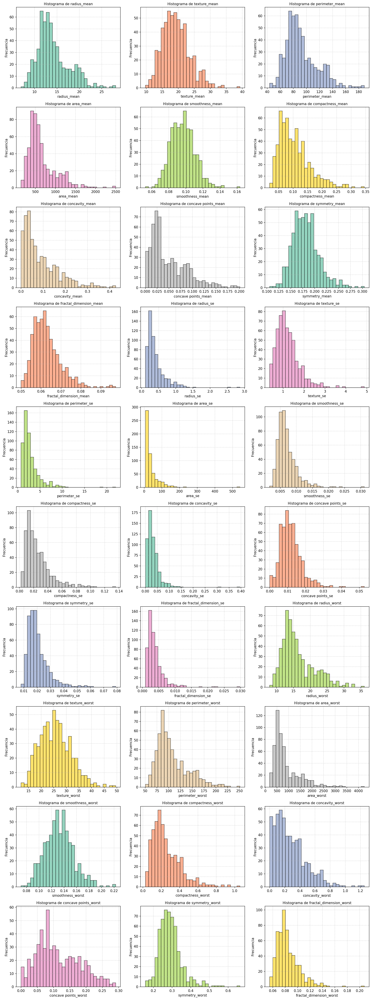

3. Distribución con KDE...


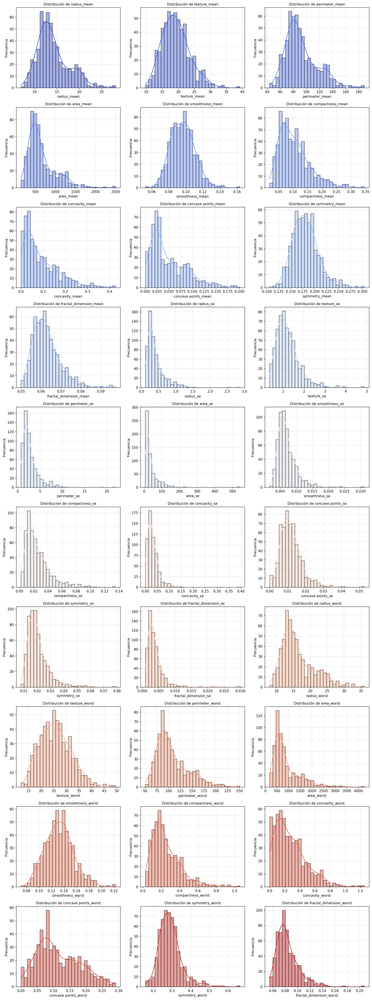

4. Gráficos de densidad...


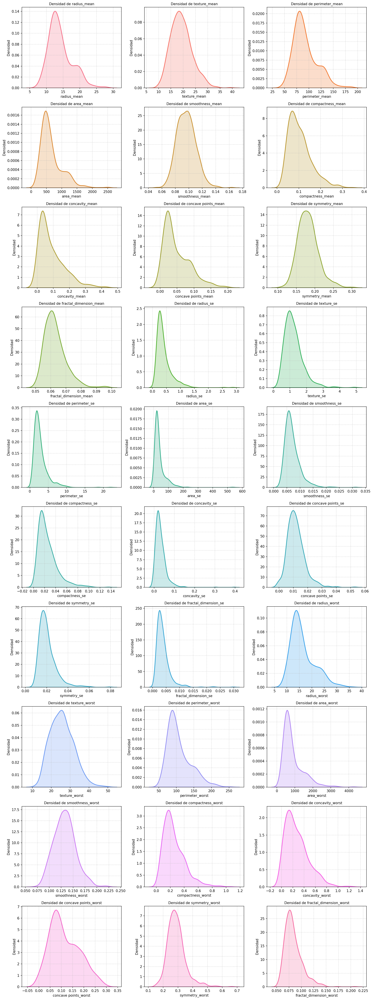

5. Análisis de correlaciones...
Matriz de correlaciones:

                         radius_mean  texture_mean  perimeter_mean  area_mean  \
radius_mean                 1.000000      0.323782        0.997855   0.987357   
texture_mean                0.323782      1.000000        0.329533   0.321086   
perimeter_mean              0.997855      0.329533        1.000000   0.986507   
area_mean                   0.987357      0.321086        0.986507   1.000000   
smoothness_mean             0.170581     -0.023389        0.207278   0.177028   
compactness_mean            0.506124      0.236702        0.556936   0.498502   
concavity_mean              0.676764      0.302418        0.716136   0.685983   
concave points_mean         0.822529      0.293464        0.850977   0.823269   
symmetry_mean               0.147741      0.071401        0.183027   0.151293   
fractal_dimension_mean     -0.311631     -0.076437       -0.261477  -0.283110   
radius_se                   0.679090      0.275869 

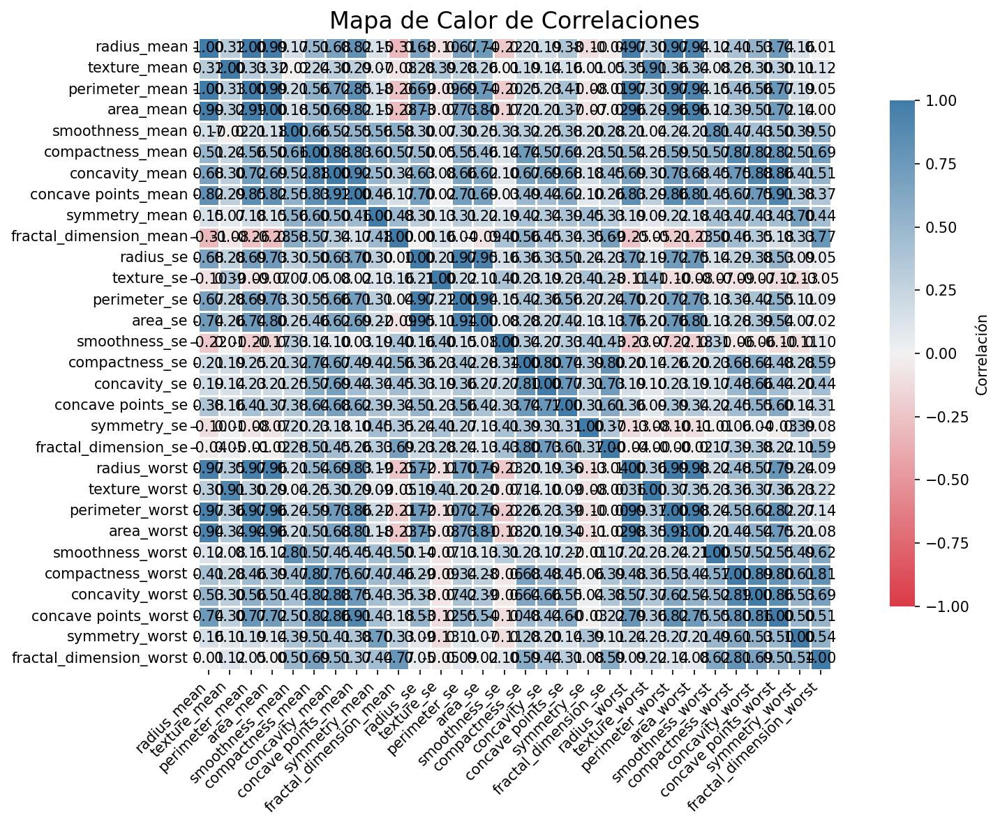

6. Gráficos de dispersión...


In [6]:
# Visualizaciones del EDA
print("\n--- GENERANDO VISUALIZACIONES ---")

print("1. Boxplots para detección de outliers...")
eda.graficoBoxplot()

print("2. Histogramas de distribución...")
eda.histogramas()

print("3. Distribución con KDE...")
eda.distribucionVariables()

print("4. Gráficos de densidad...")
eda.datosDensidad()

print("5. Análisis de correlaciones...")
eda.correlaciones()
eda.graficoCorrelacion()

print("6. Gráficos de dispersión...")
eda.graficosDispersion()

In [7]:
# ============================================================================
# PARTE 3: PREPROCESAMIENTO DE DATOS
# ============================================================================

print("\n" + "=" * 80)
print("FASE 2: PREPROCESAMIENTO DE DATOS")
print("=" * 80)

# Asignar X (features) e y (target)
# 'diagnosis' es la variable objetivo, las demás son características
X = eda.df.drop('diagnosis', axis=1)
y = eda.df['diagnosis']

# Convertir la variable objetivo 'diagnosis' a valores numéricos (M=1, B=0)
y = y.map({'M': 1, 'B': 0})

print(f"\nDimensiones de X (features): {X.shape}")
print(f"Dimensiones de y (target): {y.shape}")

# Dividir el dataset en conjuntos de entrenamiento y prueba
# Usamos un 80% para entrenamiento y un 20% para prueba
# random_state asegura que la división sea reproducible
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

print(f"\nDimensiones X_train: {X_train.shape}")
print(f"Dimensiones X_test: {X_test.shape}")
print(f"Dimensiones y_train: {y_train.shape}")
print(f"Dimensiones y_test: {y_test.shape}")

# Escalar las características numéricas
# StandardScaler estandariza las características eliminando la media y escalando a la varianza unitaria.
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print("\nCaracterísticas escaladas: X_train_scaled y X_test_scaled creadas.")


  


FASE 2: PREPROCESAMIENTO DE DATOS

Dimensiones de X (features): (569, 30)
Dimensiones de y (target): (569,)

Dimensiones X_train: (455, 30)
Dimensiones X_test: (114, 30)
Dimensiones y_train: (455,)
Dimensiones y_test: (114,)

Características escaladas: X_train_scaled y X_test_scaled creadas.


In [8]:
# ============================================================================
# PARTE 4: IMPLEMENTACIÓN DE MODELOS - 5 ALGORITMOS CON 5 CONFIGURACIONES
# ============================================================================

print("\n" + "=" * 80)
print("FASE 3: IMPLEMENTACIÓN Y ENTRENAMIENTO DE MODELOS")
print("=" * 80)

# Diccionario para almacenar resultados
resultados = []

# ============================================================================
# MODELO 1: REGRESIÓN LOGÍSTICA (5 configuraciones)
# ============================================================================

print("\n--- MODELO 1: REGRESIÓN LOGÍSTICA ---")
print("Descripción: Modelo lineal que estima probabilidades usando función logística")
print("Características: Simple, interpretable, eficiente computacionalmente")

lr_configs = [
    {'C': 0.01, 'solver': 'liblinear', 'max_iter': 1000},
    {'C': 0.1, 'solver': 'lbfgs', 'max_iter': 1000},
    {'C': 1.0, 'solver': 'lbfgs', 'max_iter': 1000},
    {'C': 10.0, 'solver': 'saga', 'max_iter': 1000},
    {'C': 100.0, 'solver': 'newton-cg', 'max_iter': 1000}
]

for i, config in enumerate(lr_configs, 1):
    print(f"\nConfiguracion LR-{i}: C={config['C']}, solver={config['solver']}")
    model = LogisticRegression(random_state=42, **config)
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]

    resultados.append({
        'Modelo': f'LR-{i}',
        'Algoritmo': 'Logistic Regression',
        'Configuracion': str(config),
        'Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred),
        'Recall': recall_score(y_test, y_pred),
        'F1-Score': f1_score(y_test, y_pred),
        'ROC-AUC': roc_auc_score(y_test, y_pred_proba),
        'Error': 1 - accuracy_score(y_test, y_pred)
    })

# ============================================================================
# MODELO 2: ÁRBOLES DE DECISIÓN (5 configuraciones)
# ============================================================================

print("\n--- MODELO 2: ÁRBOLES DE DECISIÓN ---")
print("Descripción: Modelo que divide el espacio mediante reglas de decisión")
print("Características: No lineal, interpretable, propenso a overfitting")

dt_configs = [
    {'max_depth': 3, 'min_samples_split': 2, 'criterion': 'gini'},
    {'max_depth': 5, 'min_samples_split': 5, 'criterion': 'gini'},
    {'max_depth': 10, 'min_samples_split': 10, 'criterion': 'entropy'},
    {'max_depth': 15, 'min_samples_split': 20, 'criterion': 'gini'},
    {'max_depth': None, 'min_samples_split': 2, 'criterion': 'entropy'}
]

for i, config in enumerate(dt_configs, 1):
    print(f"\nConfiguracion DT-{i}: max_depth={config['max_depth']}, criterion={config['criterion']}")
    model = DecisionTreeClassifier(random_state=42, **config)
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]

    resultados.append({
        'Modelo': f'DT-{i}',
        'Algoritmo': 'Decision Tree',
        'Configuracion': str(config),
        'Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred),
        'Recall': recall_score(y_test, y_pred),
        'F1-Score': f1_score(y_test, y_pred),
        'ROC-AUC': roc_auc_score(y_test, y_pred_proba),
        'Error': 1 - accuracy_score(y_test, y_pred)
    })

# ============================================================================
# MODELO 3: RANDOM FOREST (5 configuraciones)
# ============================================================================

print("\n--- MODELO 3: RANDOM FOREST ---")
print("Descripción: Ensamble de árboles de decisión con votación mayoritaria")
print("Características: Robusto, reduce overfitting, alta precisión")

rf_configs = [
    {'n_estimators': 50, 'max_depth': 5, 'min_samples_split': 2},
    {'n_estimators': 100, 'max_depth': 10, 'min_samples_split': 5},
    {'n_estimators': 200, 'max_depth': 15, 'min_samples_split': 10},
    {'n_estimators': 300, 'max_depth': 20, 'min_samples_split': 5},
    {'n_estimators': 500, 'max_depth': None, 'min_samples_split': 2}
]

for i, config in enumerate(rf_configs, 1):
    print(f"\nConfiguracion RF-{i}: n_estimators={config['n_estimators']}, max_depth={config['max_depth']}")
    model = RandomForestClassifier(random_state=42, **config)
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]

    resultados.append({
        'Modelo': f'RF-{i}',
        'Algoritmo': 'Random Forest',
        'Configuracion': str(config),
        'Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred),
        'Recall': recall_score(y_test, y_pred),
        'F1-Score': f1_score(y_test, y_pred),
        'ROC-AUC': roc_auc_score(y_test, y_pred_proba),
        'Error': 1 - accuracy_score(y_test, y_pred)
    })

# ============================================================================
# MODELO 4: SUPPORT VECTOR MACHINE (5 configuraciones)
# ============================================================================

print("\n--- MODELO 4: SUPPORT VECTOR MACHINE (SVM) ---")
print("Descripción: Encuentra el hiperplano óptimo que separa las clases")
print("Características: Efectivo en espacios de alta dimensión, kernel tricks")

svm_configs = [
    {'C': 0.1, 'kernel': 'linear', 'gamma': 'scale'},
    {'C': 1.0, 'kernel': 'rbf', 'gamma': 'scale'},
    {'C': 10.0, 'kernel': 'rbf', 'gamma': 'auto'},
    {'C': 100.0, 'kernel': 'poly', 'degree': 3, 'gamma': 'scale'},
    {'C': 1.0, 'kernel': 'sigmoid', 'gamma': 'scale'}
]

for i, config in enumerate(svm_configs, 1):
    print(f"\nConfiguracion SVM-{i}: C={config['C']}, kernel={config['kernel']}")
    model = SVC(random_state=42, probability=True, **config)
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]

    resultados.append({
        'Modelo': f'SVM-{i}',
        'Algoritmo': 'Support Vector Machine',
        'Configuracion': str(config),
        'Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred),
        'Recall': recall_score(y_test, y_pred),
        'F1-Score': f1_score(y_test, y_pred),
        'ROC-AUC': roc_auc_score(y_test, y_pred_proba),
        'Error': 1 - accuracy_score(y_test, y_pred)
    })

# ============================================================================
# MODELO 5: K-NEAREST NEIGHBORS (5 configuraciones)
# ============================================================================

print("\n--- MODELO 5: K-NEAREST NEIGHBORS (KNN) ---")
print("Descripción: Clasifica basándose en los K vecinos más cercanos")
print("Características: No paramétrico, simple, sensible a escala")

knn_configs = [
    {'n_neighbors': 3, 'weights': 'uniform', 'metric': 'euclidean'},
    {'n_neighbors': 5, 'weights': 'distance', 'metric': 'euclidean'},
    {'n_neighbors': 7, 'weights': 'uniform', 'metric': 'manhattan'},
    {'n_neighbors': 10, 'weights': 'distance', 'metric': 'euclidean'},
    {'n_neighbors': 15, 'weights': 'distance', 'metric': 'minkowski', 'p': 3}
]

for i, config in enumerate(knn_configs, 1):
    print(f"\nConfiguracion KNN-{i}: n_neighbors={config['n_neighbors']}, weights={config['weights']}")
    model = KNeighborsClassifier(**config)
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]

    resultados.append({
        'Modelo': f'KNN-{i}',
        'Algoritmo': 'K-Nearest Neighbors',
        'Configuracion': str(config),
        'Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred),
        'Recall': recall_score(y_test, y_pred),
        'F1-Score': f1_score(y_test, y_pred),
        'ROC-AUC': roc_auc_score(y_test, y_pred_proba),
        'Error': 1 - accuracy_score(y_test, y_pred)
    })



FASE 3: IMPLEMENTACIÓN Y ENTRENAMIENTO DE MODELOS

--- MODELO 1: REGRESIÓN LOGÍSTICA ---
Descripción: Modelo lineal que estima probabilidades usando función logística
Características: Simple, interpretable, eficiente computacionalmente

Configuracion LR-1: C=0.01, solver=liblinear

Configuracion LR-2: C=0.1, solver=lbfgs

Configuracion LR-3: C=1.0, solver=lbfgs

Configuracion LR-4: C=10.0, solver=saga

Configuracion LR-5: C=100.0, solver=newton-cg

--- MODELO 2: ÁRBOLES DE DECISIÓN ---
Descripción: Modelo que divide el espacio mediante reglas de decisión
Características: No lineal, interpretable, propenso a overfitting

Configuracion DT-1: max_depth=3, criterion=gini

Configuracion DT-2: max_depth=5, criterion=gini

Configuracion DT-3: max_depth=10, criterion=entropy

Configuracion DT-4: max_depth=15, criterion=gini

Configuracion DT-5: max_depth=None, criterion=entropy

--- MODELO 3: RANDOM FOREST ---
Descripción: Ensamble de árboles de decisión con votación mayoritaria
Característic

In [9]:
# PARTE 5: ANÁLISIS DE RESULTADOS Y MÉTRICAS
# ============================================================================

print("\n" + "=" * 80)
print("FASE 4: ANÁLISIS DE RESULTADOS")
print("=" * 80)

# Crear DataFrame con resultados
df_resultados = pd.DataFrame(resultados)

print("\n--- TABLA COMPLETA DE RESULTADOS ---")
print(df_resultados.to_string(index=False))

# Análisis estadístico por algoritmo
print("\n--- ESTADÍSTICAS POR ALGORITMO ---")
stats_por_algoritmo = df_resultados.groupby('Algoritmo').agg({
    'Accuracy': ['mean', 'std', 'min', 'max'],
    'Precision': ['mean', 'std', 'min', 'max'],
    'Recall': ['mean', 'std', 'min', 'max'],
    'F1-Score': ['mean', 'std', 'min', 'max'],
    'ROC-AUC': ['mean', 'std', 'min', 'max']
})
print(stats_por_algoritmo)


FASE 4: ANÁLISIS DE RESULTADOS

--- TABLA COMPLETA DE RESULTADOS ---
Modelo              Algoritmo                                                             Configuracion  Accuracy  Precision   Recall  F1-Score  ROC-AUC    Error
  LR-1    Logistic Regression                      {'C': 0.01, 'solver': 'liblinear', 'max_iter': 1000}  0.964912   0.975000 0.928571  0.951220 0.998016 0.035088
  LR-2    Logistic Regression                           {'C': 0.1, 'solver': 'lbfgs', 'max_iter': 1000}  0.982456   1.000000 0.952381  0.975610 0.997685 0.017544
  LR-3    Logistic Regression                           {'C': 1.0, 'solver': 'lbfgs', 'max_iter': 1000}  0.964912   0.975000 0.928571  0.951220 0.996032 0.035088
  LR-4    Logistic Regression                           {'C': 10.0, 'solver': 'saga', 'max_iter': 1000}  0.973684   0.975610 0.952381  0.963855 0.988757 0.026316
  LR-5    Logistic Regression                     {'C': 100.0, 'solver': 'newton-cg', 'max_iter': 1000}  0.947368   0.97


--- GENERANDO VISUALIZACIONES COMPARATIVAS ---


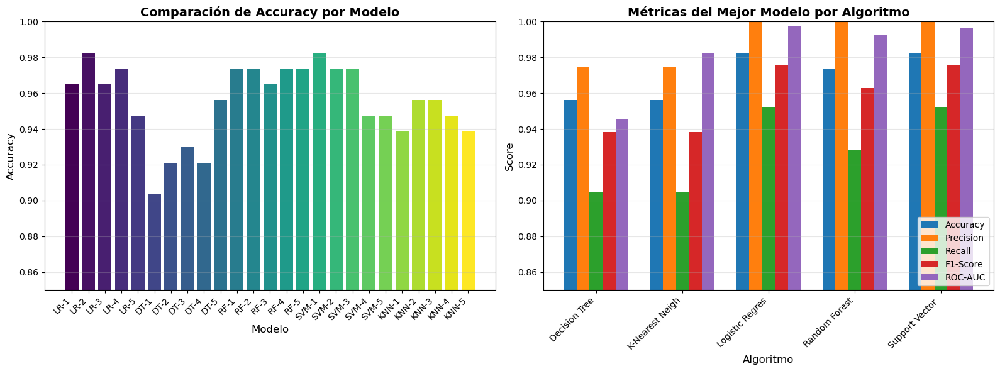

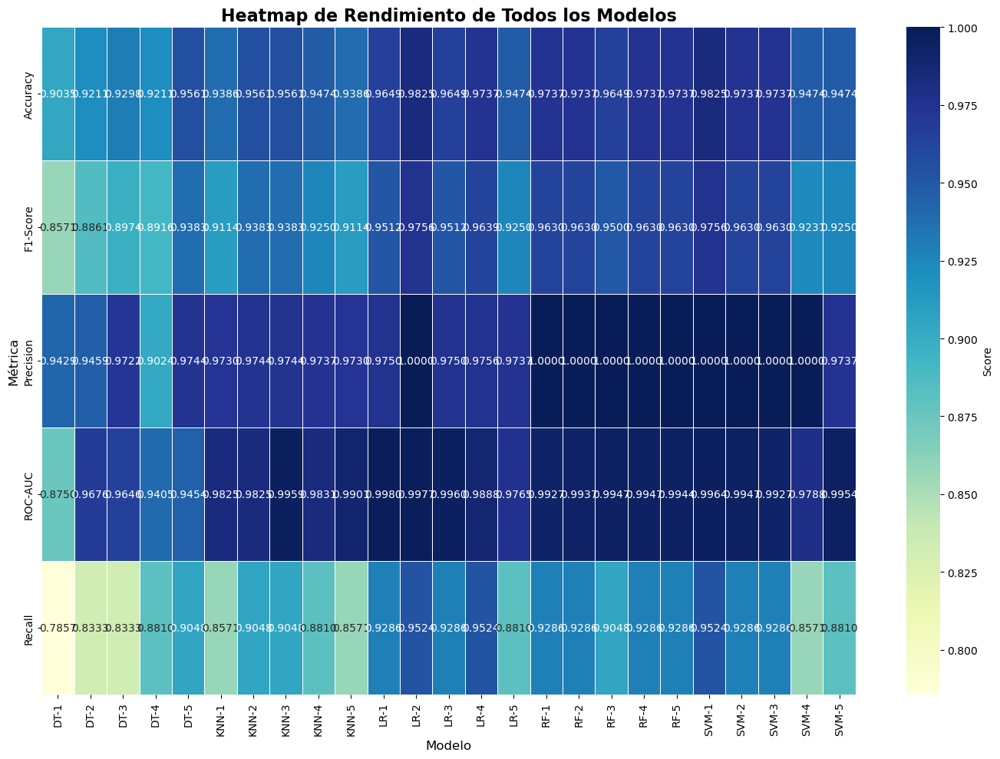

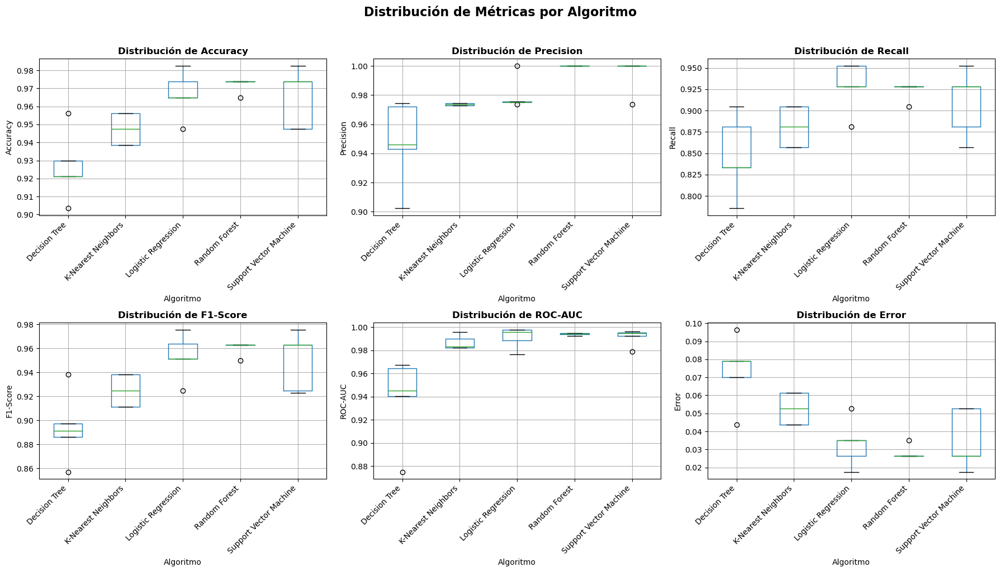

In [10]:
# ============================================================================
# PARTE 6: VISUALIZACIONES COMPARATIVAS
# ============================================================================

print("\n--- GENERANDO VISUALIZACIONES COMPARATIVAS ---")

# Gráfico 1: Comparación de Accuracy por modelo
plt.figure(figsize=(16, 6))
plt.subplot(1, 2, 1)
colors = plt.cm.viridis(np.linspace(0, 1, len(df_resultados)))
plt.bar(df_resultados['Modelo'], df_resultados['Accuracy'], color=colors)
plt.xlabel('Modelo', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.title('Comparación de Accuracy por Modelo', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.ylim([0.85, 1.0])
plt.grid(axis='y', alpha=0.3)

# Gráfico 2: Comparación de métricas del mejor modelo de cada algoritmo
plt.subplot(1, 2, 2)
mejores_modelos = df_resultados.loc[df_resultados.groupby('Algoritmo')['Accuracy'].idxmax()]
metricas = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC-AUC']
x = np.arange(len(mejores_modelos))
width = 0.15

for i, metrica in enumerate(metricas):
    plt.bar(x + i * width, mejores_modelos[metrica], width, label=metrica)

plt.xlabel('Algoritmo', fontsize=12)
plt.ylabel('Score', fontsize=12)
plt.title('Métricas del Mejor Modelo por Algoritmo', fontsize=14, fontweight='bold')
plt.xticks(x + width * 2, mejores_modelos['Algoritmo'].str[:15], rotation=45, ha='right')
plt.legend(loc='lower right')
plt.ylim([0.85, 1.0])
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 3: Heatmap de rendimiento
plt.figure(figsize=(14, 10))
pivot_data = df_resultados.pivot_table(
    values=['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC-AUC'],
    index='Modelo',
    aggfunc='first'
)
sns.heatmap(pivot_data.T, annot=True, fmt='.4f', cmap='YlGnBu', 
            cbar_kws={'label': 'Score'}, linewidths=0.5)
plt.title('Heatmap de Rendimiento de Todos los Modelos', fontsize=16, fontweight='bold')
plt.xlabel('Modelo', fontsize=12)
plt.ylabel('Métrica', fontsize=12)
plt.tight_layout()
plt.show()

# Gráfico 4: Boxplot comparativo por algoritmo
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
metricas_plot = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC-AUC', 'Error']

for idx, metrica in enumerate(metricas_plot):
    ax = axes[idx // 3, idx % 3]
    df_resultados.boxplot(column=metrica, by='Algoritmo', ax=ax)
    ax.set_title(f'Distribución de {metrica}', fontsize=12, fontweight='bold')
    ax.set_xlabel('Algoritmo', fontsize=10)
    ax.set_ylabel(metrica, fontsize=10)
    ax.tick_params(axis='x', rotation=45)
    plt.sca(ax)
    plt.xticks(rotation=45, ha='right')

plt.suptitle('Distribución de Métricas por Algoritmo', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

In [11]:
# ============================================================================
# PARTE 7: CUADRO COMPARATIVO FINAL
# ============================================================================

print("\n" + "=" * 80)
print("FASE 5: CUADRO COMPARATIVO FINAL")
print("=" * 80)

# Top 10 modelos
print("\n--- TOP 10 MODELOS POR ACCURACY ---")
top_10 = df_resultados.nlargest(10, 'Accuracy')[['Modelo', 'Algoritmo', 'Accuracy', 
                                                    'Precision', 'Recall', 'F1-Score', 
                                                    'ROC-AUC', 'Error']]
print(top_10.to_string(index=False))

# Mejor modelo global
mejor_modelo = df_resultados.loc[df_resultados['Accuracy'].idxmax()]
print("\n" + "=" * 80)
print("🏆 MEJOR MODELO GLOBAL")
print("=" * 80)
print(f"Modelo: {mejor_modelo['Modelo']}")
print(f"Algoritmo: {mejor_modelo['Algoritmo']}")
print(f"Accuracy: {mejor_modelo['Accuracy']:.4f}")
print(f"Precision: {mejor_modelo['Precision']:.4f}")
print(f"Recall: {mejor_modelo['Recall']:.4f}")
print(f"F1-Score: {mejor_modelo['F1-Score']:.4f}")
print(f"ROC-AUC: {mejor_modelo['ROC-AUC']:.4f}")
print(f"Error: {mejor_modelo['Error']:.4f}")
print(f"Configuración: {mejor_modelo['Configuracion']}")

# Resumen ejecutivo
print("\n" + "=" * 80)
print("RESUMEN EJECUTIVO")
print("=" * 80)
print(f"Total de modelos evaluados: {len(resultados)}")
print(f"Algoritmos utilizados: {df_resultados['Algoritmo'].nunique()}")
print(f"Configuraciones por algoritmo: 5")
print(f"\nMejor Accuracy promedio: {df_resultados.groupby('Algoritmo')['Accuracy'].mean().max():.4f}")
print(f"Algoritmo más consistente: {df_resultados.groupby('Algoritmo')['Accuracy'].std().idxmin()}")
print(f"Rango de Accuracy: [{df_resultados['Accuracy'].min():.4f}, {df_resultados['Accuracy'].max():.4f}]")

# Exportar resultados
df_resultados.to_csv('resultados_modelos.csv', index=False)
print("\n✓ Resultados exportados a 'resultados_modelos.csv'")

print("\n" + "=" * 80)
print("ANÁLISIS COMPLETADO EXITOSAMENTE")
print("=" * 80)


FASE 5: CUADRO COMPARATIVO FINAL

--- TOP 10 MODELOS POR ACCURACY ---
Modelo              Algoritmo  Accuracy  Precision   Recall  F1-Score  ROC-AUC    Error
  LR-2    Logistic Regression  0.982456    1.00000 0.952381  0.975610 0.997685 0.017544
 SVM-1 Support Vector Machine  0.982456    1.00000 0.952381  0.975610 0.996362 0.017544
  LR-4    Logistic Regression  0.973684    0.97561 0.952381  0.963855 0.988757 0.026316
  RF-1          Random Forest  0.973684    1.00000 0.928571  0.962963 0.992725 0.026316
  RF-2          Random Forest  0.973684    1.00000 0.928571  0.962963 0.993717 0.026316
  RF-4          Random Forest  0.973684    1.00000 0.928571  0.962963 0.994709 0.026316
  RF-5          Random Forest  0.973684    1.00000 0.928571  0.962963 0.994378 0.026316
 SVM-2 Support Vector Machine  0.973684    1.00000 0.928571  0.962963 0.994709 0.026316
 SVM-3 Support Vector Machine  0.973684    1.00000 0.928571  0.962963 0.992725 0.026316
  LR-1    Logistic Regression  0.964912    0.9750